# Sea Surface Temperature (SST)

## Variables, attributes, and dimensions of .nc file

In [36]:
import xarray as xr

# File path
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Sst\20250615120000-REMSS-L4_GHRSST-SSTfnd-MW_OI-GLOB-v02.0-fv05.1.nc"

# Open dataset
ds = xr.open_dataset(file_path)

# Print dataset structure
print(ds)

# List all variables
print("\nVariables in file:")
for var in ds.variables:
    print(f" - {var}: {ds[var].dims} {ds[var].shape}")

# List dimensions
print("\nDimensions:")
for dim in ds.dims:
    print(f" - {dim}: {ds.dims[dim]}")

# List global attributes
print("\nGlobal attributes:")
for attr in ds.attrs:
    print(f" - {attr}: {ds.attrs[attr]}")


<xarray.Dataset> Size: 17MB
Dimensions:           (lat: 720, lon: 1440, time: 1)
Coordinates:
  * lat               (lat) float32 3kB -89.88 -89.62 -89.38 ... 89.62 89.88
  * lon               (lon) float32 6kB -179.9 -179.6 -179.4 ... 179.6 179.9
  * time              (time) datetime64[ns] 8B 2025-06-15T12:00:00
Data variables:
    analysed_sst      (time, lat, lon) float32 4MB ...
    analysis_error    (time, lat, lon) float32 4MB ...
    sea_ice_fraction  (time, lat, lon) float32 4MB ...
    mask              (time, lat, lon) float32 4MB ...
Attributes: (12/46)
    Conventions:                CF-1.8,ACDD-1.3
    title:                      Analysed foundation sea surface temperature o...
    summary:                    A merged, multi-sensor L4 foundation SST prod...
    references:                 http://www.remss.com/measurements/sea-surface...
    institution:                REMSS
    history:                    2025-07-02 17:06:51+0000 created by sst_fusio...
    ...            

C:\Users\siva4\AppData\Local\Temp\ipykernel_22416\4206468784.py:20: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  print(f" - {dim}: {ds.dims[dim]}")


## At a particular month & speific region


Variables in file:
 - lat: dims=('lat',), shape=(720,), long_name='No description', units='degrees_north'
 - lon: dims=('lon',), shape=(1440,), long_name='No description', units='degrees_east'
 - time: dims=('time',), shape=(1,), long_name='nominal time of L4 analysis', units='No units'
 - analysed_sst: dims=('time', 'lat', 'lon'), shape=(1, 720, 1440), long_name='analysed sea surface temperature', units='K'
 - analysis_error: dims=('time', 'lat', 'lon'), shape=(1, 720, 1440), long_name='estimated error standard deviation of analysed_sst', units='K'
 - sea_ice_fraction: dims=('time', 'lat', 'lon'), shape=(1, 720, 1440), long_name='sea ice area fraction', units='No units'
 - mask: dims=('time', 'lat', 'lon'), shape=(1, 720, 1440), long_name='land sea ice lake bit mask', units='No units'


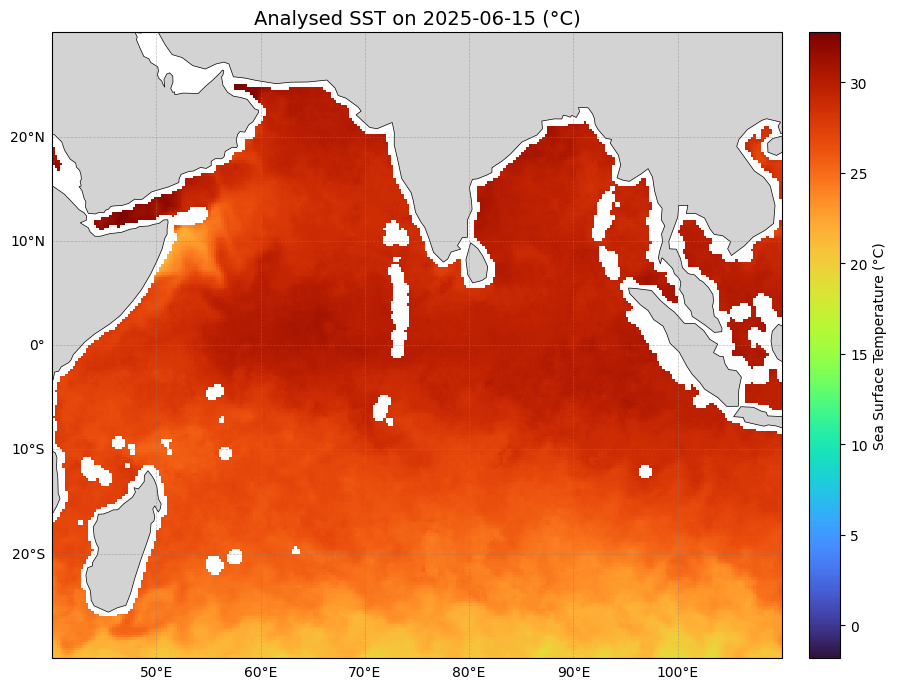

In [38]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker

# ========================
# File path
# ========================
file_path = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Sst\20250615120000-REMSS-L4_GHRSST-SSTfnd-MW_OI-GLOB-v02.0-fv05.1.nc"

# ========================
# Open dataset
# ========================
ds = xr.open_dataset(file_path)

# Inspect variables
print("\nVariables in file:")
for var in ds.variables:
    long_name = ds[var].attrs.get('long_name', 'No description')
    units = ds[var].attrs.get('units', 'No units')
    print(f" - {var}: dims={ds[var].dims}, shape={ds[var].shape}, long_name='{long_name}', units='{units}'")

# ========================
# Extract SST and convert from Kelvin to Celsius
# ========================
sst_c = ds['analysed_sst'].squeeze()
if ds['analysed_sst'].attrs.get('units', '').lower() in ['kelvin', 'k']:
    sst_c = sst_c - 273.15  # Kelvin to °C

# ========================
# Region extent (lon_min, lon_max, lat_min, lat_max)
# ========================
region_extent = [40, 110, -30, 30]  # Indian Ocean example

# ========================
# Plot SST data with basemap
# ========================
fig = plt.figure(figsize=(14, 7))
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Set extent
ax.set_extent(region_extent, crs=ccrs.PlateCarree())

# Add land and coastlines
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)

# Plot SST data
im = ax.pcolormesh(
    ds['lon'], ds['lat'], sst_c,
    cmap='turbo', transform=ccrs.PlateCarree(),
    zorder=0
)

# Latitude and longitude gridlines + labels
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xformatter = cticker.LongitudeFormatter()
gl.yformatter = cticker.LatitudeFormatter()
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

# Add colorbar to the right
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02, fraction=0.05)
cbar.set_label("Sea Surface Temperature (°C)")

# Title
time_str = str(ds['time'].values[0])[:10]
plt.title(f"Analysed SST on {time_str} (°C)", fontsize=14)

plt.tight_layout()
plt.show()


## At variable months and regions

C:\Users\siva4\AppData\Local\Temp\ipykernel_1640\1957492913.py:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])


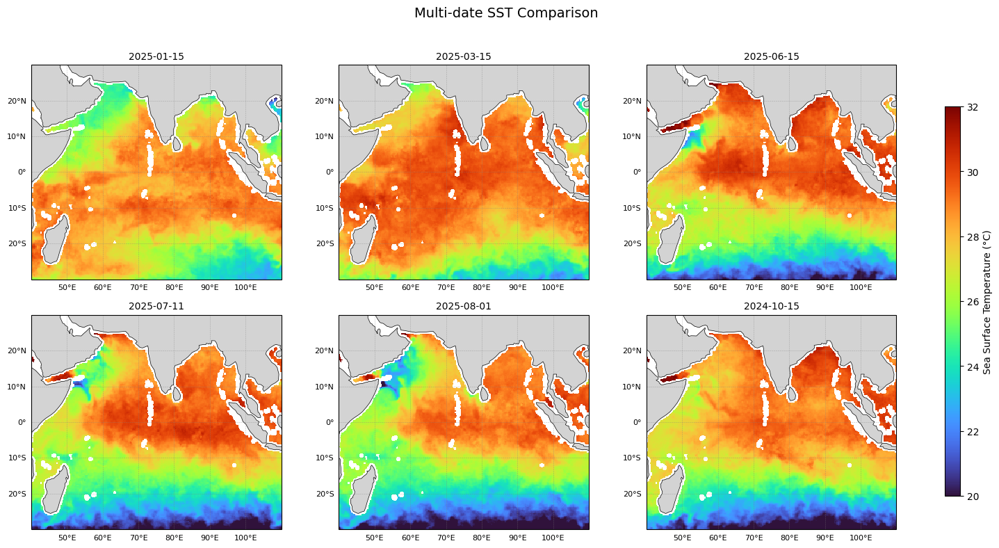

In [7]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
from pathlib import Path
import math
import pandas as pd


# ========================
# Folder path
# ========================
folder_path = Path(r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Sst")

# ========================
# Region extent (lon_min, lon_max, lat_min, lat_max)
# ========================
region_extent = [40, 110, -30, 30]  # Example: Indian Ocean

# ========================
# Colorbar range (None for auto)
# Example: (20, 32) for fixed °C range
# ========================
fixed_cbar_range = (20, 32)  # or None

# ========================
# Load all .nc files
# ========================
def sort_by_month_day(file_path):
    with xr.open_dataset(file_path) as ds:
        t = pd.to_datetime(ds['time'].values[0])
        return (t.month, t.day)

nc_files = sorted(folder_path.glob("*.nc"), key=sort_by_month_day)
#nc_files = sorted(folder_path.glob("*.nc"))
n_files = len(nc_files)

# Determine subplot grid size
cols = 3
rows = math.ceil(n_files / cols)

# ========================
# First pass to find min/max if auto colorbar
# ========================
if fixed_cbar_range is None:
    all_values = []
    for file_path in nc_files:
        ds = xr.open_dataset(file_path)
        sst_c = ds['analysed_sst'].squeeze()
        if ds['analysed_sst'].attrs.get('units', '').lower() in ['kelvin', 'k']:
            sst_c = sst_c - 273.15
        all_values.append(sst_c.min().item())
        all_values.append(sst_c.max().item())
        ds.close()
    vmin, vmax = min(all_values), max(all_values)
else:
    vmin, vmax = fixed_cbar_range

# ========================
# Plot all in subplots
# ========================
fig = plt.figure(figsize=(5 * cols, 4 * rows))

for i, file_path in enumerate(nc_files, 1):
    ds = xr.open_dataset(file_path)
    
    # Extract SST and convert from Kelvin to °C if needed
    sst_c = ds['analysed_sst'].squeeze()
    if ds['analysed_sst'].attrs.get('units', '').lower() in ['kelvin', 'k']:
        sst_c = sst_c - 273.15
    
    ax = plt.subplot(rows, cols, i, projection=ccrs.PlateCarree())
    ax.set_extent(region_extent, crs=ccrs.PlateCarree())
    
    # Add land and coastlines
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)
    
    # Plot SST
    im = ax.pcolormesh(
        ds['lon'], ds['lat'], sst_c,
        cmap='turbo', transform=ccrs.PlateCarree(),
        zorder=0, vmin=vmin, vmax=vmax
    )
    
    # Gridlines and labels
    gl = ax.gridlines(draw_labels=True, linewidth=0.4, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = cticker.LongitudeFormatter()
    gl.yformatter = cticker.LatitudeFormatter()
    gl.xlabel_style = {'size': 8}
    gl.ylabel_style = {'size': 8}
    
    # Title
    time_str = str(ds['time'].values[0])[:10]
    ax.set_title(time_str, fontsize=10)
    
    ds.close()

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.1, 0.015, 0.7])  # position: x, y, width, height
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label("Sea Surface Temperature (°C)")

plt.suptitle("Multi-date SST Comparison", fontsize=14)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

plt.show()


## Identify the various seasons based on SST patterns and also describe their associated processes in asscoiation with vectors which are available on respective sections ?

# ASCAT Winds 

## Wind stress

### Problem: Ekman Vertical Velocity in the North Atlantic

At latitude **35°N** in the North Atlantic, a buoy measures surface wind stress components on a 5×5 km grid. The observed wind stress varies across the grid, with **eastward component (τx, N/m²)** and **northward component (τy, N/m²)** as follows:

**Eastward component (τx, N/m²):**

| 0.04 | 0.05 | 0.06 | 0.06 | 0.05 |
|------|------|------|------|------|
| 0.05 | 0.06 | 0.07 | 0.08 | 0.06 |
| 0.06 | 0.07 | 0.08 | 0.09 | 0.07 |
| 0.05 | 0.07 | 0.08 | 0.08 | 0.06 |
| 0.04 | 0.05 | 0.06 | 0.06 | 0.05 |

**Northward component (τy, N/m²):**

| -0.08 | -0.07 | -0.06 | -0.05 | -0.06 |
|-------|-------|-------|-------|-------|
| -0.07 | -0.06 | -0.05 | -0.04 | -0.05 |
| -0.06 | -0.05 | -0.04 | -0.03 | -0.04 |
| -0.07 | -0.06 | -0.05 | -0.04 | -0.05 |
| -0.08 | -0.07 | -0.06 | -0.05 | -0.06 |

**Given constants:**
- Seawater density: ρ = 1025 kg/m³  
- Ekman layer depth: L = 50 m  
- Earth's rotation rate: Ω = 7.292 × 10⁻⁵ rad/s  

**Tasks:**
1. Compute the **Ekman vertical velocity** at interior points using the wind stress curl.  
2. Determine whether the resulting motion corresponds to **cyclonic (upwelling)** or **anticyclonic (downwelling)** circulation.  


Coriolis parameter f = 8.36503875e-05 1/s

Average Ekman vertical velocity (m/s): 1.30 × 10^-5
Average Ekman vertical velocity (m/day): 1.12 × 10^0


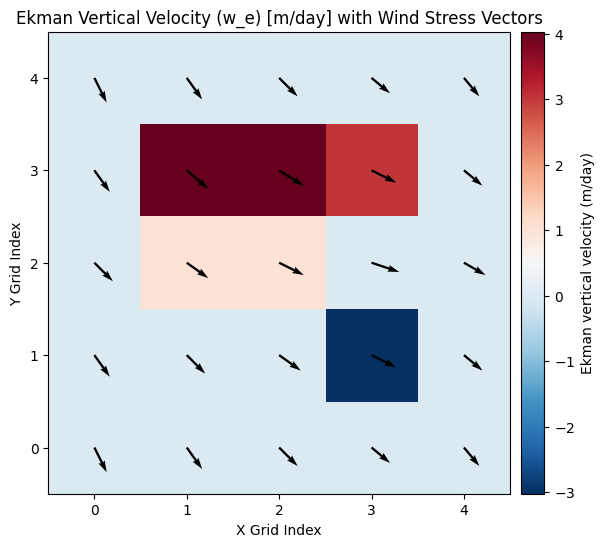

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from matplotlib.patches import Rectangle

# -----------------------------
# Constants
# -----------------------------
rho = 1025           # Seawater density (kg/m³)
phi = 35             # Latitude (degrees)
Omega = 7.292e-5     # Earth's rotation rate (rad/s)
dx = dy = 5000       # Grid spacing in meters (5 km)
ny, nx = 5, 5        # Grid size

# -----------------------------
# Coriolis parameter
# f = 2 * Omega * sin(phi)
# -----------------------------
f = 2 * Omega * np.sin(np.radians(phi))
print("Coriolis parameter f = {:.8e} 1/s".format(f))

# -----------------------------
# Wind stress arrays (τx, τy)
# -----------------------------
tau_x = np.array([[0.04, 0.05, 0.06, 0.06, 0.05],
                  [0.05, 0.06, 0.07, 0.08, 0.06],
                  [0.06, 0.07, 0.08, 0.09, 0.07],
                  [0.05, 0.07, 0.08, 0.08, 0.06],
                  [0.04, 0.05, 0.06, 0.06, 0.05]])

tau_y = np.array([[-0.08, -0.07, -0.06, -0.05, -0.06],
                  [-0.07, -0.06, -0.05, -0.04, -0.05],
                  [-0.06, -0.05, -0.04, -0.03, -0.04],
                  [-0.07, -0.06, -0.05, -0.04, -0.05],
                  [-0.08, -0.07, -0.06, -0.05, -0.06]])

# -----------------------------
# Compute curl(τ)
# curl(τ) = ∂τy/∂x - ∂τx/∂y
# -----------------------------
curl = np.zeros((ny, nx))
for j in range(1, ny-1):
    for i in range(1, nx-1):
        dtauy_dx = (tau_y[j, i+1] - tau_y[j, i-1]) / (2*dx)   # ∂τy/∂x
        dtaux_dy = (tau_x[j+1, i] - tau_x[j-1, i]) / (2*dy)   # ∂τx/∂y
        curl[j, i] = dtauy_dx - dtaux_dy                       # curl(τ)

# -----------------------------
# Compute Ekman vertical velocity
# w_e = curl(τ) / (ρ * f)
# -----------------------------
w_e = curl / (rho * f)       # m/s
w_e_md = w_e * 86400         # Convert to m/day (1 day = 86400 s)

# -----------------------------
# Interior 3x3 grid for averaging
# -----------------------------
interior_we = w_e[1:-1,1:-1]
interior_we_md = w_e_md[1:-1,1:-1]

average_we = np.mean(interior_we)
average_we_md = np.mean(interior_we_md)

# -----------------------------
# Scientific notation formatting
# -----------------------------
def sci_str(x):
    s = "{:.2e}".format(x)
    base, exp = s.split("e")
    return "{} × 10^{}".format(base, int(exp))

print("\nAverage Ekman vertical velocity (m/s):", sci_str(average_we))
print("Average Ekman vertical velocity (m/day):", sci_str(average_we_md))
#print("Result:", "Cyclonic (upwelling)" if average_we>0 else "Anticyclonic (downwelling)")

# -----------------------------
# Visualization
# -----------------------------
X, Y = np.meshgrid(np.arange(nx), np.arange(ny))

fig, ax = plt.subplots(figsize=(7,6))
c = ax.imshow(w_e_md, origin='lower', cmap='RdBu_r', interpolation='nearest')

# Colorbar with scientific notation
cbar = fig.colorbar(c, ax=ax, fraction=0.05, pad=0.02)
cbar.set_label('Ekman vertical velocity (m/day)')
formatter = ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0,0))
cbar.formatter = formatter
cbar.update_ticks()

# Wind stress vectors with scale
ax.quiver(X, Y, tau_x, tau_y, color='k', angles='xy', scale_units='xy', scale=0.30, width=0.005)

ax.set_title("Ekman Vertical Velocity (w_e) [m/day] with Wind Stress Vectors")
ax.set_xlabel("X Grid Index")
ax.set_ylabel("Y Grid Index")

plt.show()


# Wind stress for variable months & regions

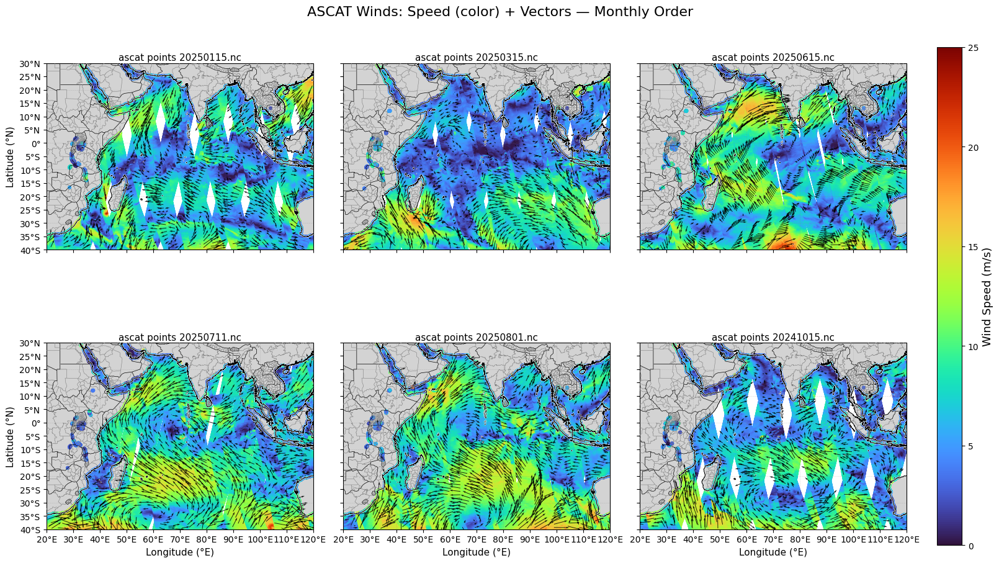

In [15]:
import os, re, glob
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# ============================
# Folder with .nc files
# ============================
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"

# ============================
# Collect & sort files by month/day/year
# ============================
def sort_key(fname):
    m = re.search(r'(\d{8})', os.path.basename(fname))
    if m:
        ymd = m.group(1)
        return (int(ymd[4:6]), int(ymd[6:8]), int(ymd[0:4]))
    return (99,99,9999)

nc_files = sorted(glob.glob(os.path.join(folder, "*.nc")), key=sort_key)

# ============================
# ROI and ticks
# ============================
# For Indian coastal ocean
#ROI = [60, 100, -10, 25]   # [lon_min, lon_max, lat_min, lat_max]

# For Indian ocean
ROI = [20, 120, -40, 30]

xticks = np.arange(ROI[0], ROI[1] + 0.1, 10)
yticks = np.arange(ROI[2], ROI[3] + 0.1, 5)

# ============================
# Option: set fixed colorbar range
# ============================
USER_VMIN, USER_VMAX = 0, 25   # set None for auto scaling

# ============================
# Helper
# ============================
def read_masked(fp, ROI):
    ds = xr.open_dataset(fp)
    u, v = ds["u_obs"].values, ds["v_obs"].values
    ws = ds["wind_speed"].values
    lon, lat = ds["lon"].values, ds["lat"].values
    mask = ((lon >= ROI[0]) & (lon <= ROI[1]) &
            (lat >= ROI[2]) & (lat <= ROI[3]))
    return lon[mask], lat[mask], u[mask], v[mask], ws[mask]

# ============================
# Loop in groups of 6 (2x3 subplots)
# ============================
ncols, nrows = 3, 2
per_fig = ncols * nrows

for start in range(0, len(nc_files), per_fig):
    subset = nc_files[start:start+per_fig]

    # Pre-compute color scale if user did not fix it
    wmins, wmaxs, cached = [], [], []
    for fp in subset:
        lon, lat, u, v, ws = read_masked(fp, ROI)
        cached.append((fp, lon, lat, u, v, ws))
        if ws.size:
            wmins.append(np.nanmin(ws))
            wmaxs.append(np.nanmax(ws))
    vmin = USER_VMIN if USER_VMIN is not None else (min(wmins) if wmins else None)
    vmax = USER_VMAX if USER_VMAX is not None else (max(wmaxs) if wmaxs else None)

    # Figure with shared colorbar
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 9),
                             subplot_kw={"projection": ccrs.PlateCarree()},
                             constrained_layout=True)
    axes = axes.flatten()

    last_sc = None
    for j, (ax, item) in enumerate(zip(axes, cached)):
        fp, lon, lat, u, v, ws = item

        ax.set_extent(ROI, crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=0)

        # --- COASTAL BOUNDARY (crisp) ---
        # subtle white halo beneath a sharp black coastline so it stands out
        coast_white = cfeature.NaturalEarthFeature(
            'physical', 'coastline', '10m', edgecolor='white',
            facecolor='none', linewidth=1.6)
        coast_black = cfeature.NaturalEarthFeature(
            'physical', 'coastline', '10m', edgecolor='black',
            facecolor='none', linewidth=0.8)
        ax.add_feature(coast_white, zorder=4)   # halo
        ax.add_feature(coast_black, zorder=5)   # crisp coast on top

        # Country borders + state/province lines
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, zorder=3)
        ax.add_feature(cfeature.NaturalEarthFeature(
            'cultural', 'admin_1_states_provinces_lines', '10m',
            edgecolor='gray', facecolor='none', linewidth=0.4, zorder=3))

        # Wind speed scatter (background shading)
        if ws.size:
            last_sc = ax.scatter(lon, lat, c=ws, cmap="turbo", s=10,
                                 vmin=vmin, vmax=vmax,
                                 transform=ccrs.PlateCarree(), zorder=2)

        # Wind vectors (overlay on scatter)
        if u.size and v.size:
            skip = max(1, len(lon)//1200)  # balance density
            ax.quiver(lon[::skip], lat[::skip],
                      u[::skip], v[::skip],
                      transform=ccrs.PlateCarree(),
                      scale=300, width=0.0022,
                      color="k", alpha=0.85, zorder=3)

        # Grid + ticks
        ax.set_xticks(xticks, crs=ccrs.PlateCarree())
        ax.set_yticks(yticks, crs=ccrs.PlateCarree())
        ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.gridlines(draw_labels=False, linewidth=0.4, linestyle=":", color="0.5", alpha=0.6)

        # Only outer labels to avoid clutter (no bottom-left labels on inner plots)
        if j // ncols == nrows-1:
            ax.set_xlabel("Longitude (°E)", fontsize=11)
        else:
            ax.set_xlabel("")
            ax.tick_params(labelbottom=False)
        if j % ncols == 0:
            ax.set_ylabel("Latitude (°N)", fontsize=11)
        else:
            ax.set_ylabel("")
            ax.tick_params(labelleft=False)

        # Title
        ax.set_title(os.path.basename(fp).replace('_', ' '), fontsize=11, pad=3)

    # Remove unused axes if fewer than 6 files
    for k in range(len(subset), per_fig):
        fig.delaxes(axes[k])

    # Shared colorbar
    if last_sc is not None:
        cbar = fig.colorbar(last_sc, ax=axes, orientation="vertical", shrink=0.9, pad=0.02)
        cbar.set_label("Wind Speed (m/s)", fontsize=13)

    fig.suptitle("ASCAT Winds: Speed (color) + Vectors — Monthly Order", fontsize=16, y=1.02)
    plt.show()


## Indeitfy various seasons based on given monthly wind vectors,describe typical characteristics with special focus of Bay of bengal and Arabian sea in connection with SSTs.

# Wind Stress, Wind Stress Curl, Ekman Transport and Pumping

Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20241015.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250115.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250315.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250615.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250711.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250801.nc
Saved multi-day panel: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_multi_day_panel.png


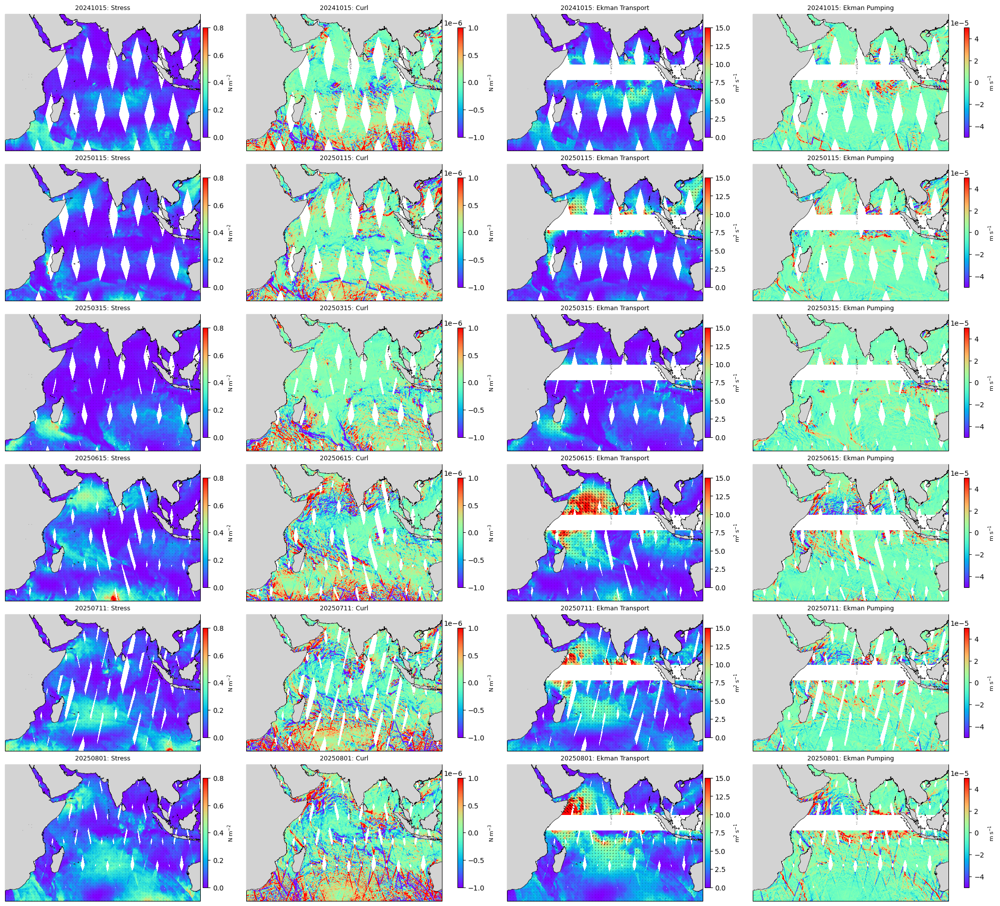


Min/Max values across all files:
tau:   min = 5.668e-07, max = 3.713e+00
curl:  min = -3.780e-05, max = 4.744e-05
M:     min = 1.783e-05, max = 9.781e+01
w_ek:  min = -1.345e-03, max = 1.721e-03


In [79]:
"""
ASCAT multi-day panel plots:
Compute wind stress, stress curl, Ekman transport, Ekman pumping
and plot them in a matrix (N rows = N dates, 4 cols = variables).

Features:
- rainbow colormap for all fields
- user-editable colorbar ranges per parameter
- no-data regions white (not part of colorbar)
- vector overlays for wind stress & Ekman transport

Formulas / choices (documented in code):
 - Drag coefficient Cd: Large and Pond (1981) piecewise:
     Cd*1e3 = 0.49 + 0.065 U   for U <= 11 m/s
     Cd*1e3 = 1.12 + 0.018 U   for 11 < U <= 25 m/s
     Cd*1e3 = 2.39             for U > 25 m/s  (cap)
   Cd used in stress τ = ρ_a * Cd * U * |U|  (vector form via components)
 - Air density rho_a default 1.225 kg/m3 (user-adjustable)
 - Seawater density rho_w = 1025 kg/m3
 - Coriolis f = 2 Ω sin(lat) with Ω = 7.292115e-5 s^-1
 - Ekman transport per unit length M = k × τ / (ρ_w f)  -> components:
       Mx = - τ_y / (ρ_w f)
       My =   τ_x / (ρ_w f)
 - Ekman pumping (vertical velocity) w_ek = (1/(ρ_w f)) * (∂τ_y/∂x - ∂τ_x/∂y)
"""

import os, glob, re
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ================= USER PARAMETERS =================
IN_DIR = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"
OUT_FIG = os.path.join(IN_DIR, "ascat_multi_day_panel.png")

# Domain and grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# Physical constants
rho_a = 1.225
rho_w = 1025.0
omega = 7.292115e-5
R_earth = 6371000.0
F_THRESHOLD = 1e-5

#Plotting options (edit ranges as needed, None = auto)
# plot_options = {
#     "tau":    {"vmin": None, "vmax": None, "units": "N m$^{-2}$", "vectors": True},
#     "curl":   {"vmin": None, "vmax": None, "units": "N m$^{-3}$", "symmetric": True, "vectors": False},
#     "M":      {"vmin": None, "vmax": None, "units": "m$^2$ s$^{-1}$", "vectors": True},
#     "w_ek":   {"vmin": None, "vmax": None, "units": "m s$^{-1}$", "symmetric": True, "vectors": False},
# }

plot_options = {
    "tau":  {"vmin": 0, "vmax": 0.8, "units": "N m$^{-2}$", "symmetric": False, "vectors": True},
    "curl": {"vmin": -1e-6, "vmax": +1e-6, "units": "N m$^{-3}$", "symmetric": True,  "vectors": False},
    "M":    {"vmin": 0, "vmax": 15, "units": "m$^2$ s$^{-1}$", "symmetric": False, "vectors": True},
    "w_ek": {"vmin": -5e-5, "vmax": +5e-5, "units": "m s$^{-1}$", "symmetric": True,  "vectors": False},
}

# Vector thinning
VEC_SKIP = 6   # lower → denser

# ===================================================
def process_file(fp):
    """Load one ASCAT point-cloud file, bin, compute stress, curl, Ekman."""
    ds = xr.open_dataset(fp)
    lon_pts, lat_pts = ds["lon"].values, ds["lat"].values
    u_pts, v_pts = ds["u_obs"].values, ds["v_obs"].values
    spd_pts = ds["wind_speed"].values

    lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
    lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

    stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

    # transpose → (lat, lon)
    u_grid, v_grid, spd_grid = np.transpose(stat_u), np.transpose(stat_v), np.transpose(stat_s)

    lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
    lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
    Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

    # Drag coefficient (Large & Pond 1981 style)
    U = spd_grid.copy()
    Cd = np.full_like(U, np.nan)
    mask1 = (U <= 11.0) & np.isfinite(U)
    mask2 = (U > 11.0) & (U <= 25.0)
    mask3 = (U > 25.0)
    Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
    Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
    Cd[mask3] = 2.39e-3

    # Wind stress
    tau_x = rho_a * Cd * u_grid * np.abs(U)
    tau_y = rho_a * Cd * v_grid * np.abs(U)
    tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
    tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

    # Coriolis
    f = 2.0 * omega * np.sin(np.deg2rad(Lat2d))
    safe_f = np.where(np.abs(f) < F_THRESHOLD, np.nan, f)

    # Grid spacing (m)
    deg2rad = np.pi / 180.0
    dlon_rad, dlat_rad = RES_DEG * deg2rad, RES_DEG * deg2rad
    dx = R_earth * np.cos(np.deg2rad(Lat2d)) * dlon_rad
    dy = R_earth * dlat_rad

    # Curl
    dtauy_dx = np.gradient(tau_y, axis=1) / dx
    dtaux_dy = np.gradient(tau_x, axis=0) / dy
    curl_tau = dtauy_dx - dtaux_dy

    # Ekman transport
    Mx = -tau_y / (rho_w * safe_f)
    My =  tau_x / (rho_w * safe_f)
    M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
    M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan   # no-data as NaN

    # Ekman pumping
    w_ek = curl_tau / (rho_w * safe_f)

    return Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek

# ===================================================
def plot_field(ax, Lon, Lat, field, title, opts, vectors=None):
    data_masked = np.ma.masked_invalid(field)
    cmap = plt.get_cmap("rainbow").copy()
    cmap.set_bad("white")   # no-data as white, not part of cbar

    if opts.get("symmetric", False):
        vmax = opts["vmax"] if opts["vmax"] is not None else np.nanmax(np.abs(field))
        vmin = -vmax if opts["vmin"] is None else opts["vmin"]
    else:
        vmin = opts["vmin"] if opts["vmin"] is not None else np.nanmin(field)
        vmax = opts["vmax"] if opts["vmax"] is not None else np.nanmax(field)

    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto",
                        vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    ax.coastlines(resolution="10m", linewidth=0.5, zorder=6)
    ax.set_title(title, fontsize=9)

    if vectors is not None:
        U, V = vectors
        ax.quiver(Lon[::VEC_SKIP, ::VEC_SKIP], Lat[::VEC_SKIP, ::VEC_SKIP],
                  U[::VEC_SKIP, ::VEC_SKIP], V[::VEC_SKIP, ::VEC_SKIP],
                  transform=ccrs.PlateCarree(),
                  scale=1000, width=0.002, color="k", alpha=0.8, zorder=10)

    cb = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.01, shrink=0.8)
    cb.set_label(opts["units"], fontsize=8)
    return pcm

# ===================================================
# Collect all point files
nc_files = sorted(glob.glob(os.path.join(IN_DIR, "ascat_points_*.nc")))
n_dates = len(nc_files)

# Store min/max for each parameter
tau_min, tau_max = [], []
curl_min, curl_max = [], []
M_min, M_max = [], []
w_min, w_max = [], []

fig, axes = plt.subplots(n_dates, 4, figsize=(20, 3*n_dates),
                         subplot_kw={"projection": ccrs.PlateCarree()},
                         constrained_layout=True)

if n_dates == 1:
    axes = axes[np.newaxis, :]  # force 2D array

for i, fp in enumerate(nc_files):
    print("Processing:", fp)
    Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek = process_file(fp)

    # Store min/max
    tau_min.append(np.nanmin(tau_mag)); tau_max.append(np.nanmax(tau_mag))
    curl_min.append(np.nanmin(curl_tau)); curl_max.append(np.nanmax(curl_tau))
    M_min.append(np.nanmin(M_mag)); M_max.append(np.nanmax(M_mag))
    w_min.append(np.nanmin(w_ek)); w_max.append(np.nanmax(w_ek))

    date_str = re.search(r"(\d{8})", os.path.basename(fp)).group(1)

    plot_field(axes[i,0], Lon2d, Lat2d, tau_mag, f"{date_str}: Stress", plot_options["tau"], vectors=(tau_x, tau_y))
    plot_field(axes[i,1], Lon2d, Lat2d, curl_tau, f"{date_str}: Curl", plot_options["curl"])
    plot_field(axes[i,2], Lon2d, Lat2d, M_mag, f"{date_str}: Ekman Transport", plot_options["M"], vectors=(Mx, My))
    plot_field(axes[i,3], Lon2d, Lat2d, w_ek, f"{date_str}: Ekman Pumping", plot_options["w_ek"])

plt.savefig(OUT_FIG, dpi=250, bbox_inches="tight")
print("Saved multi-day panel:", OUT_FIG)
plt.show()

# Print min/max values across all files
print("\nMin/Max values across all files:")
print(f"tau:   min = {np.nanmin(tau_min):.3e}, max = {np.nanmax(tau_max):.3e}")
print(f"curl:  min = {np.nanmin(curl_min):.3e}, max = {np.nanmax(curl_max):.3e}")
print(f"M:     min = {np.nanmin(M_min):.3e}, max = {np.nanmax(M_max):.3e}")
print(f"w_ek:  min = {np.nanmin(w_min):.3e}, max = {np.nanmax(w_max):.3e}")



Available parameters to plot:
 - tau
 - curl
 - M
 - w_ek

Enter a comma-separated list of parameters to plot (e.g., tau,curl or M,w_ek).
Press Enter to plot ALL.


Your selection:  tau



You selected: tau

Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20241015.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250115.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250315.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250615.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250711.nc
Processing: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_points_20250801.nc

Saved panel: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_multi_day_panel_tau.png


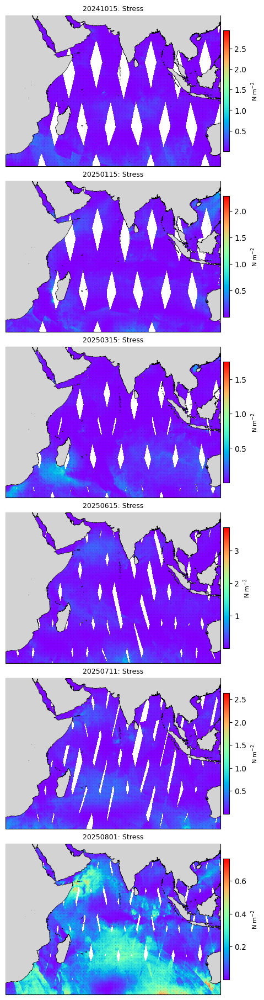


Min/Max values across all files (only for chosen parameters):
tau  :  min = 5.668e-07, max = 3.713e+00


In [55]:
"""
ASCAT multi-day panel plots (flexible parameter selection):
- Computes wind stress (tau), stress curl (curl), Ekman transport (M), Ekman pumping (w_ek).
- First shows available parameters; you can pick which ones to plot.
- Only the chosen parameters are displayed and saved (others are not plotted/saved).

Features:
- rainbow colormap for all fields
- user-editable colorbar ranges per parameter
- no-data regions white (not part of colorbar)
- vector overlays for wind stress & Ekman transport

Formulas / choices (documented in code):
 - Drag coefficient Cd: Large and Pond (1981) piecewise:
     Cd*1e3 = 0.49 + 0.065 U   for U <= 11 m/s
     Cd*1e3 = 1.12 + 0.018 U   for 11 < U <= 25 m/s
     Cd*1e3 = 2.39             for U > 25 m/s  (cap)
   Cd used in stress τ = ρ_a * Cd * U * |U|  (vector form via components)
 - Air density rho_a default 1.225 kg/m3 (user-adjustable)
 - Seawater density rho_w = 1025 kg/m3
 - Coriolis f = 2 Ω sin(lat) with Ω = 7.292115e-5 s^-1
 - Ekman transport per unit length M = k × τ / (ρ_w f)  -> components:
       Mx = - τ_y / (ρ_w f)
       My =   τ_x / (ρ_w f)
 - Ekman pumping (vertical velocity) w_ek = (1/(ρ_w f)) * (∂τ_y/∂x - ∂τ_x/∂y)
"""

import os, glob, re, sys
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ================= USER PARAMETERS =================
IN_DIR = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"
OUT_BASENAME = "ascat_multi_day_panel"  # final name will include selected params

# Domain and grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# Physical constants
rho_a = 1.225
rho_w = 1025.0
omega = 7.292115e-5
R_earth = 6371000.0
F_THRESHOLD = 1e-5

# --- Selection behavior ---
# If USE_PROMPT = True, you will be prompted at runtime to select parameters.
# If USE_PROMPT = False, the script uses SELECT_PARAMS below (edit the list).
USE_PROMPT = True
SELECT_PARAMS = ["tau", "curl", "M", "w_ek"]  # only used if USE_PROMPT=False

# Plotting options (edit ranges as needed, None = auto)
PLOT_OPTIONS = {
    "tau":  {"vmin": None, "vmax": None, "units": "N m$^{-2}$", "symmetric": False, "vectors": True},
    "curl": {"vmin": None, "vmax": None, "units": "N m$^{-3}$", "symmetric": True,  "vectors": False},
    "M":    {"vmin": None, "vmax": None, "units": "m$^2$ s$^{-1}$", "symmetric": False, "vectors": True},
    "w_ek": {"vmin": None, "vmax": None, "units": "m s$^{-1}$", "symmetric": True,  "vectors": False},
}

# Vector thinning
VEC_SKIP = 6   # lower → denser

# ===================================================
def human_list(items):
    return ", ".join(items)

def prompt_select_params():
    available = ["tau", "curl", "M", "w_ek"]
    print("\nAvailable parameters to plot:")
    for key in available:
        print(f" - {key}")
    print("\nEnter a comma-separated list of parameters to plot (e.g., tau,curl or M,w_ek).")
    print("Press Enter to plot ALL.")
    raw = input("Your selection: ").strip()
    if raw == "":
        chosen = available
    else:
        chosen = [t.strip() for t in raw.split(",") if t.strip() in available]
        if not chosen:
            print("No valid selection detected; defaulting to ALL.")
            chosen = available
    print(f"\nYou selected: {human_list(chosen)}\n")
    return chosen

def process_file(fp):
    """Load one ASCAT point-cloud file, bin, compute stress, curl, Ekman."""
    ds = xr.open_dataset(fp)
    lon_pts, lat_pts = ds["lon"].values, ds["lat"].values
    u_pts, v_pts = ds["u_obs"].values, ds["v_obs"].values
    spd_pts = ds["wind_speed"].values

    lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
    lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

    stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

    # transpose → (lat, lon)
    u_grid, v_grid, spd_grid = np.transpose(stat_u), np.transpose(stat_v), np.transpose(stat_s)

    lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
    lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
    Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

    # Drag coefficient (Large & Pond 1981 style)
    U = spd_grid.copy()
    Cd = np.full_like(U, np.nan)
    mask1 = (U <= 11.0) & np.isfinite(U)
    mask2 = (U > 11.0) & (U <= 25.0)
    mask3 = (U > 25.0)
    Cd[mask1] = (0.49 + 0.065 * U[mask1]) * 1e-3
    Cd[mask2] = (1.12 + 0.018 * U[mask2]) * 1e-3
    Cd[mask3] = 2.39e-3

    # Wind stress (vector)
    tau_x = rho_a * Cd * u_grid * np.abs(U)
    tau_y = rho_a * Cd * v_grid * np.abs(U)
    tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
    tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

    # Coriolis
    f = 2.0 * omega * np.sin(np.deg2rad(Lat2d))
    safe_f = np.where(np.abs(f) < F_THRESHOLD, np.nan, f)

    # Grid spacing (m)
    deg2rad = np.pi / 180.0
    dlon_rad, dlat_rad = RES_DEG * deg2rad, RES_DEG * deg2rad
    dx = R_earth * np.cos(np.deg2rad(Lat2d)) * dlon_rad
    dy = R_earth * dlat_rad

    # Curl of stress
    dtauy_dx = np.gradient(tau_y, axis=1) / dx
    dtaux_dy = np.gradient(tau_x, axis=0) / dy
    curl_tau = dtauy_dx - dtaux_dy

    # Ekman transport (vector) and magnitude
    Mx = -tau_y / (rho_w * safe_f)
    My =  tau_x / (rho_w * safe_f)
    M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
    M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan

    # Ekman pumping
    w_ek = curl_tau / (rho_w * safe_f)

    return Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek

def plot_field(ax, Lon, Lat, field, title, opts, vectors=None):
    data_masked = np.ma.masked_invalid(field)
    cmap = plt.get_cmap("rainbow").copy()
    cmap.set_bad("white")   # no-data as white, not part of cbar

    if opts.get("symmetric", False):
        vmax = opts["vmax"] if opts["vmax"] is not None else np.nanmax(np.abs(field))
        vmin = -vmax if opts["vmin"] is None else opts["vmin"]
    else:
        # Use nanmin/nanmax so blank fields don't crash autoscaling
        finite_vals = field[np.isfinite(field)]
        if finite_vals.size == 0:
            vmin = 0.0
            vmax = 1.0
        else:
            vmin = opts["vmin"] if opts["vmin"] is not None else np.nanmin(finite_vals)
            vmax = opts["vmax"] if opts["vmax"] is not None else np.nanmax(finite_vals)

    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto",
                        vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    ax.coastlines(resolution="10m", linewidth=0.5, zorder=6)
    ax.set_title(title, fontsize=9)

    if vectors is not None:
        Uv, Vv = vectors
        ax.quiver(Lon[::VEC_SKIP, ::VEC_SKIP], Lat[::VEC_SKIP, ::VEC_SKIP],
                  Uv[::VEC_SKIP, ::VEC_SKIP], Vv[::VEC_SKIP, ::VEC_SKIP],
                  transform=ccrs.PlateCarree(),
                  scale=1000, width=0.002, color="k", alpha=0.8, zorder=10)

    cb = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.01, shrink=0.8)
    cb.set_label(opts["units"], fontsize=8)

def main():
    # Gather files
    nc_files = sorted(glob.glob(os.path.join(IN_DIR, "ascat_points_*.nc")))
    if len(nc_files) == 0:
        print(f"No files found matching 'ascat_points_*.nc' in {IN_DIR}")
        sys.exit(1)

    # Parameter selection
    if USE_PROMPT:
        chosen_params = prompt_select_params()
    else:
        # Validate SELECT_PARAMS against available keys
        available = {"tau", "curl", "M", "w_ek"}
        chosen_params = [p for p in SELECT_PARAMS if p in available]
        if not chosen_params:
            chosen_params = ["tau", "curl", "M", "w_ek"]
        print(f"\nParameters selected (non-interactive): {human_list(chosen_params)}\n")

    # Prepare min/max only for chosen params
    mins = {p: [] for p in chosen_params}
    maxs = {p: [] for p in chosen_params}

    n_dates = len(nc_files)
    n_cols = len(chosen_params)

    # Create figure only for chosen parameters
    fig, axes = plt.subplots(n_dates, n_cols, figsize=(5*n_cols, 3*n_dates),
                             subplot_kw={"projection": ccrs.PlateCarree()},
                             constrained_layout=True)
    if n_dates == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_dates == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    # Mapping from key to plotting lambda (to keep one loop)
    # We compute everything once per file, then plot only what is chosen.
    for i, fp in enumerate(nc_files):
        print("Processing:", fp)
        Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek = process_file(fp)
        date_str_match = re.search(r"(\d{8})", os.path.basename(fp))
        date_str = date_str_match.group(1) if date_str_match else os.path.basename(fp)

        # Prepare objects for selected parameters
        field_map = {
            "tau":  {"field": tau_mag, "opts": PLOT_OPTIONS["tau"],  "title": f"{date_str}: Stress",            "vectors": (tau_x, tau_y)},
            "curl": {"field": curl_tau, "opts": PLOT_OPTIONS["curl"], "title": f"{date_str}: Curl",              "vectors": None},
            "M":    {"field": M_mag,   "opts": PLOT_OPTIONS["M"],    "title": f"{date_str}: Ekman Transport",   "vectors": (Mx, My)},
            "w_ek": {"field": w_ek,    "opts": PLOT_OPTIONS["w_ek"], "title": f"{date_str}: Ekman Pumping",     "vectors": None},
        }

        # Plot only the chosen params (and accumulate min/max only for them)
        for j, key in enumerate(chosen_params):
            info = field_map[key]
            field = info["field"]
            mins[key].append(np.nanmin(field))
            maxs[key].append(np.nanmax(field))
            plot_field(axes[i, j], Lon2d, Lat2d, field, info["title"], info["opts"], vectors=info["vectors"])

    # Save figure with selected param names embedded
    tag = "_".join(chosen_params)
    out_fig = os.path.join(IN_DIR, f"{OUT_BASENAME}_{tag}.png")
    plt.savefig(out_fig, dpi=250, bbox_inches="tight")
    print("\nSaved panel:", out_fig)
    plt.show()

    # Report min/max for ONLY the chosen parameters
    print("\nMin/Max values across all files (only for chosen parameters):")
    for key in chosen_params:
        try:
            mn = np.nanmin(mins[key]); mx = np.nanmax(maxs[key])
            print(f"{key:5s}:  min = {mn:.3e}, max = {mx:.3e}")
        except ValueError:
            print(f"{key:5s}:  (no finite data)")

if __name__ == "__main__":
    main()



Available parameters to plot:
 - tau
 - curl
 - M
 - w_ek


Your selection (comma-separated, Enter=ALL):  w_ek


Saved panel: E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind\ascat_multi_day_panel_w_ek.png


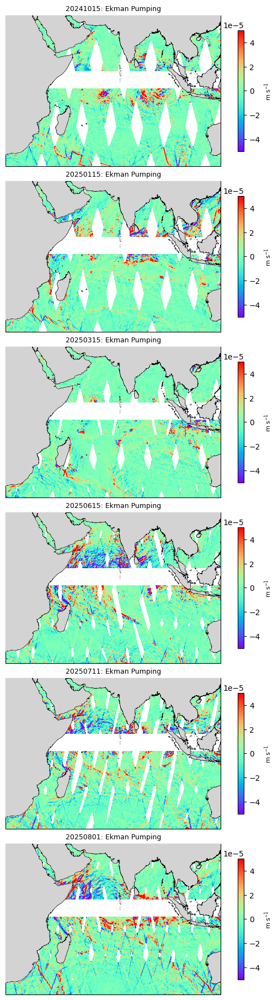

In [73]:
import os, glob, re, sys
import numpy as np
import xarray as xr
from scipy.stats import binned_statistic_2d
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ================= USER PARAMETERS =================
IN_DIR = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Wind"
OUT_BASENAME = "ascat_multi_day_panel"

# Domain and grid
LON_MIN, LON_MAX = 20.0, 120.0
LAT_MIN, LAT_MAX = -40.0, 30.0
RES_DEG = 0.25

# Physical constants
rho_a = 1.225
rho_w = 1025.0
omega = 7.292115e-5
R_earth = 6371000.0
F_THRESHOLD = 1e-5

# --- Selection behavior ---
USE_PROMPT = True
SELECT_PARAMS = ["tau", "curl", "M", "w_ek"]

# Plotting options (edit ranges, None = auto)
PLOT_OPTIONS = {
    "tau":  {"vmin": 0, "vmax": 0.8, "units": "N m$^{-2}$", "symmetric": False, "vectors": True},
    "curl": {"vmin": -1e-6, "vmax": +1e-6, "units": "N m$^{-3}$", "symmetric": True,  "vectors": False},
    "M":    {"vmin": 0, "vmax": 15, "units": "m$^2$ s$^{-1}$", "symmetric": False, "vectors": True},
    "w_ek": {"vmin": -5e-5, "vmax": +5e-5, "units": "m s$^{-1}$", "symmetric": True,  "vectors": False},
}

# Plotting options (edit ranges, None = auto)
# --------------------------------------------------------
# Edit vmin/vmax to fix the colorbar scale. If you leave them as None,
# the script will automatically compute global min/max across all files.
#
# Recommended starting ranges (based on typical ocean data):
#   - "tau"  (wind stress magnitude):      0 to ~2 N/m²
#   - "curl" (wind stress curl):           about -1e-6 to +1e-6 N/m³
#   - "M"    (Ekman transport magnitude):  0 to ~2 m²/s
#   - "w_ek" (Ekman pumping velocity):     about -5e-6 to +5e-6 m/s
#
# You can tighten or widen these depending on your region and dataset.
# --------------------------------------------------------

VEC_SKIP = 6   # vector thinning

# ===================================================
def human_list(items):
    return ", ".join(items)

def prompt_select_params():
    available = ["tau", "curl", "M", "w_ek"]
    print("\nAvailable parameters to plot:")
    for key in available:
        print(f" - {key}")
    raw = input("Your selection (comma-separated, Enter=ALL): ").strip()
    if raw == "":
        return available
    chosen = [t.strip() for t in raw.split(",") if t.strip() in available]
    return chosen if chosen else available

def process_file(fp):
    ds = xr.open_dataset(fp)
    lon_pts, lat_pts = ds["lon"].values, ds["lat"].values
    u_pts, v_pts = ds["u_obs"].values, ds["v_obs"].values
    spd_pts = ds["wind_speed"].values

    lon_edges = np.arange(LON_MIN, LON_MAX + RES_DEG, RES_DEG)
    lat_edges = np.arange(LAT_MIN, LAT_MAX + RES_DEG, RES_DEG)

    stat_u, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, u_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_v, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, v_pts, statistic='mean', bins=[lon_edges, lat_edges])
    stat_s, _, _, _ = binned_statistic_2d(lon_pts, lat_pts, spd_pts, statistic='mean', bins=[lon_edges, lat_edges])

    u_grid, v_grid, spd_grid = np.transpose(stat_u), np.transpose(stat_v), np.transpose(stat_s)

    lon_centers = 0.5 * (lon_edges[:-1] + lon_edges[1:])
    lat_centers = 0.5 * (lat_edges[:-1] + lat_edges[1:])
    Lon2d, Lat2d = np.meshgrid(lon_centers, lat_centers)

    U = spd_grid.copy()
    Cd = np.full_like(U, np.nan)
    Cd[(U <= 11.0) & np.isfinite(U)] = (0.49 + 0.065 * U[(U <= 11.0) & np.isfinite(U)]) * 1e-3
    Cd[(U > 11.0) & (U <= 25.0)] = (1.12 + 0.018 * U[(U > 11.0) & (U <= 25.0)]) * 1e-3
    Cd[U > 25.0] = 2.39e-3

    tau_x = rho_a * Cd * u_grid * np.abs(U)
    tau_y = rho_a * Cd * v_grid * np.abs(U)
    tau_mag = np.sqrt(np.nan_to_num(tau_x)**2 + np.nan_to_num(tau_y)**2)
    tau_mag[~(np.isfinite(tau_x) & np.isfinite(tau_y))] = np.nan

    f = 2.0 * omega * np.sin(np.deg2rad(Lat2d))
    safe_f = np.where(np.abs(f) < F_THRESHOLD, np.nan, f)

    dlon_rad, dlat_rad = RES_DEG * np.pi/180, RES_DEG * np.pi/180
    dx = R_earth * np.cos(np.deg2rad(Lat2d)) * dlon_rad
    dy = R_earth * dlat_rad

    dtauy_dx = np.gradient(tau_y, axis=1) / dx
    dtaux_dy = np.gradient(tau_x, axis=0) / dy
    curl_tau = dtauy_dx - dtaux_dy

    Mx = -tau_y / (rho_w * safe_f)
    My =  tau_x / (rho_w * safe_f)
    M_mag = np.sqrt(np.nan_to_num(Mx)**2 + np.nan_to_num(My)**2)
    M_mag[~(np.isfinite(Mx) & np.isfinite(My))] = np.nan

    w_ek = curl_tau / (rho_w * safe_f)

    return Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek

def plot_field(ax, Lon, Lat, field, title, opts, vmin, vmax, vectors=None):
    data_masked = np.ma.masked_invalid(field)
    cmap = plt.get_cmap("rainbow").copy()
    cmap.set_bad("white")

    pcm = ax.pcolormesh(Lon, Lat, data_masked, cmap=cmap, shading="auto",
                        vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor="lightgray", zorder=5)
    ax.coastlines(resolution="10m", linewidth=0.5, zorder=6)
    ax.set_title(title, fontsize=9)

    if vectors is not None:
        Uv, Vv = vectors
        ax.quiver(Lon[::VEC_SKIP, ::VEC_SKIP], Lat[::VEC_SKIP, ::VEC_SKIP],
                  Uv[::VEC_SKIP, ::VEC_SKIP], Vv[::VEC_SKIP, ::VEC_SKIP],
                  transform=ccrs.PlateCarree(), scale=1000, width=0.002,
                  color="k", alpha=0.8, zorder=10)

    cb = plt.gcf().colorbar(pcm, ax=ax, orientation="vertical", pad=0.01, shrink=0.8)
    cb.set_label(opts["units"], fontsize=8)

def main():
    nc_files = sorted(glob.glob(os.path.join(IN_DIR, "ascat_points_*.nc")))
    if not nc_files:
        print(f"No files found in {IN_DIR}")
        sys.exit(1)

    chosen_params = prompt_select_params() if USE_PROMPT else SELECT_PARAMS

    # ---- Pass 1: Collect global min/max for chosen params ----
    mins, maxs = {p: [] for p in chosen_params}, {p: [] for p in chosen_params}
    results = []
    for fp in nc_files:
        Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek = process_file(fp)
        results.append((fp, Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek))
        field_map = {"tau": tau_mag, "curl": curl_tau, "M": M_mag, "w_ek": w_ek}
        for key in chosen_params:
            vals = field_map[key]
            if np.isfinite(vals).any():
                mins[key].append(np.nanmin(vals))
                maxs[key].append(np.nanmax(vals))

    global_ranges = {}
    for key in chosen_params:
        opts = PLOT_OPTIONS[key]
        if opts["vmin"] is not None and opts["vmax"] is not None:
            global_ranges[key] = (opts["vmin"], opts["vmax"])
        else:
            if opts.get("symmetric", False):
                vmax = opts["vmax"] if opts["vmax"] else np.nanmax(np.abs(maxs[key] + mins[key]))
                vmin = -vmax if opts["vmin"] is None else opts["vmin"]
            else:
                vmin = opts["vmin"] if opts["vmin"] else np.nanmin(mins[key])
                vmax = opts["vmax"] if opts["vmax"] else np.nanmax(maxs[key])
            global_ranges[key] = (vmin, vmax)

    # ---- Pass 2: Plot with fixed colorbars ----
    n_dates, n_cols = len(results), len(chosen_params)
    fig, axes = plt.subplots(n_dates, n_cols, figsize=(5*n_cols, 3*n_dates),
                             subplot_kw={"projection": ccrs.PlateCarree()},
                             constrained_layout=True)
    if n_dates == 1 and n_cols == 1: axes = np.array([[axes]])
    elif n_dates == 1: axes = axes[np.newaxis, :]
    elif n_cols == 1: axes = axes[:, np.newaxis]

    for i, (fp, Lon2d, Lat2d, tau_mag, tau_x, tau_y, curl_tau, M_mag, Mx, My, w_ek) in enumerate(results):
        date_str_match = re.search(r"(\d{8})", os.path.basename(fp))
        date_str = date_str_match.group(1) if date_str_match else os.path.basename(fp)
        field_map = {
            "tau":  {"field": tau_mag, "opts": PLOT_OPTIONS["tau"],  "title": f"{date_str}: Stress",          "vectors": (tau_x, tau_y)},
            "curl": {"field": curl_tau, "opts": PLOT_OPTIONS["curl"], "title": f"{date_str}: Curl",            "vectors": None},
            "M":    {"field": M_mag,   "opts": PLOT_OPTIONS["M"],    "title": f"{date_str}: Ekman Transport", "vectors": (Mx, My)},
            "w_ek": {"field": w_ek,    "opts": PLOT_OPTIONS["w_ek"], "title": f"{date_str}: Ekman Pumping",   "vectors": None},
        }
        for j, key in enumerate(chosen_params):
            vmin, vmax = global_ranges[key]
            info = field_map[key]
            plot_field(axes[i, j], Lon2d, Lat2d, info["field"], info["title"],
                       info["opts"], vmin, vmax, vectors=info["vectors"])

    tag = "_".join(chosen_params)
    out_fig = os.path.join(IN_DIR, f"{OUT_BASENAME}_{tag}.png")
    plt.savefig(out_fig, dpi=250, bbox_inches="tight")
    print("Saved panel:", out_fig)
    plt.show()

if __name__ == "__main__":
    main()


# Chlorophyll-a 

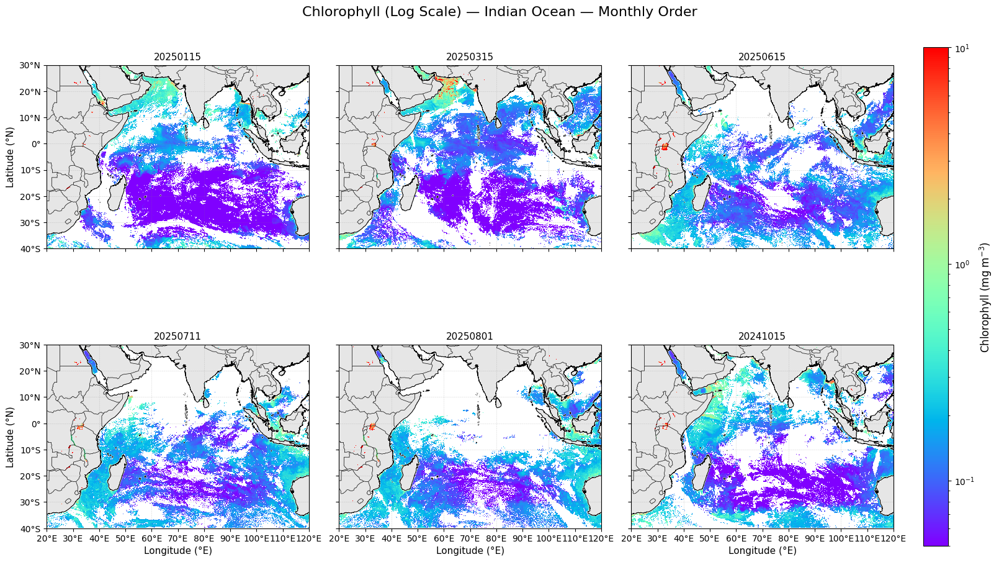

In [23]:
import os, re, glob
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# =========================================================
# Input folder with chlorophyll .nc files
# =========================================================
folder = r"E:\INCOIS\ITCOO\Classes\SNOM_Navy_2025\Chlorophyll"

# =========================================================
# Region of interest (Indian Ocean)
#   lon_min, lon_max, lat_min, lat_max (in degrees East/North)
# =========================================================
ROI = [20, 120, -40, 30]   # Indian Ocean

# Ticks
xticks = np.arange(ROI[0], ROI[1] + 0.1, 10)
yticks = np.arange(ROI[2], ROI[3] + 0.1, 10)

# =========================================================
# Color scale (log)
# =========================================================
USER_VMIN, USER_VMAX = 0.05, 10.0  # set (None,None) for auto scaling
#CMAP = "viridis"
CMAP = "rainbow"

# Optional downsampling for speed
SKIP = 4   # keep 1 of every 4 pixels (adjust if needed)

# =========================================================
# Helpers
# =========================================================
def find_lon_lat(ds):
    lon_name, lat_name = None, None
    for name, da in ds.variables.items():
        std = da.attrs.get("standard_name", "").lower()
        lower = name.lower()
        if lon_name is None and (std == "longitude" or "lon" in lower):
            lon_name = name
        if lat_name is None and (std == "latitude" or "lat" in lower):
            lat_name = name
    if lon_name is None:
        for cand in ["lon", "longitude", "x", "LON", "nav_lon"]:
            if cand in ds.variables: lon_name = cand; break
    if lat_name is None:
        for cand in ["lat", "latitude", "y", "LAT", "nav_lat"]:
            if cand in ds.variables: lat_name = cand; break
    lon, lat = ds[lon_name].values, ds[lat_name].values
    if lon.ndim == 1 and lat.ndim == 1:
        lon, lat = np.meshgrid(lon, lat)
    return lon, lat

def normalize_longitude(lon2d):
    lon = lon2d.copy()
    if np.any(lon > 180): lon[lon > 180] -= 360.0
    return lon

def find_chl_var(ds):
    for name, da in ds.variables.items():
        std = da.attrs.get("standard_name", "").lower()
        if "chlorophyll" in std:
            return name, da.attrs.get("units", "mg m^-3")
    for cand in ["chlor_a", "chl", "chlorophyll", "CHL", "chlor"]:
        if cand in ds.variables:
            return cand, ds[cand].attrs.get("units", "mg m^-3")
    for name in ds.variables:
        if "chl" in name.lower():
            return name, ds[name].attrs.get("units", "mg m^-3")
    raise ValueError("Chlorophyll variable not found.")

def apply_scaling_and_mask(da):
    arr = da.values.astype(np.float32)   # use float32 (less memory)
    fillv = da.attrs.get("_FillValue", da.encoding.get("_FillValue", None))
    missv = da.attrs.get("missing_value", None)
    mask = np.zeros(arr.shape, dtype=bool)
    if fillv is not None: mask |= np.isclose(arr, fillv)
    if missv is not None: mask |= np.isclose(arr, missv)
    arr = np.ma.masked_where(mask, arr)
    sf = da.attrs.get("scale_factor", da.encoding.get("scale_factor", 1.0))
    ao = da.attrs.get("add_offset",  da.encoding.get("add_offset", 0.0))
    arr = arr * float(sf if sf is not None else 1.0) + float(ao if ao is not None else 0.0)
    arr = np.ma.masked_where(arr <= 0, arr)  # log safety
    return arr

def extract_date_from_name(path):
    m = re.search(r'(\d{8})', os.path.basename(path))
    if not m: return (99,99,9999)
    ymd = m.group(1)
    return (int(ymd[4:6]), int(ymd[6:8]), int(ymd[0:4]))  # (month, day, year)

# =========================================================
# Collect files
# =========================================================
nc_files = sorted(glob.glob(os.path.join(folder, "*.nc")), key=extract_date_from_name)
if not nc_files:
    raise FileNotFoundError("No .nc files found.")

# =========================================================
# Plotting (2x3 per page)
# =========================================================
ncols, nrows = 3, 2
per_fig = ncols * nrows
proj = ccrs.PlateCarree()

for start in range(0, len(nc_files), per_fig):
    subset = nc_files[start:start + per_fig]

    cached, page_min, page_max = [], np.inf, -np.inf
    for fp in subset:
        with xr.open_dataset(fp) as ds:
            lon, lat = find_lon_lat(ds)
            lon, lat = normalize_longitude(lon), lat
            chl_name, chl_units = find_chl_var(ds)
            chl = apply_scaling_and_mask(ds[chl_name])

            # Downsample for speed
            lon, lat, chl = lon[::SKIP, ::SKIP], lat[::SKIP, ::SKIP], chl[::SKIP, ::SKIP]

            mask = (lon >= ROI[0]) & (lon <= ROI[1]) & (lat >= ROI[2]) & (lat <= ROI[3])
            chl_roi = np.ma.masked_where(~mask, chl)

            if chl_roi.count() > 0:
                page_min = min(page_min, float(chl_roi.min()))
                page_max = max(page_max, float(chl_roi.max()))

            cached.append((fp, lon, lat, chl_roi, chl_units))

    vmin = USER_VMIN if USER_VMIN is not None else max(1e-3, page_min)
    vmax = USER_VMAX if USER_VMAX is not None else page_max

    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 9),
                             subplot_kw={"projection": proj},
                             constrained_layout=True)
    axes = axes.flatten()

    last_mappable = None
    for j, (ax, item) in enumerate(zip(axes, cached)):
        fp, lon, lat, chl_roi, chl_units = item
        ax.set_extent(ROI, crs=proj)

        # Features
        ax.add_feature(cfeature.LAND, facecolor="0.9")
        coast_white = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                                   edgecolor='white', facecolor='none', linewidth=1.6)
        coast_black = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                                   edgecolor='black', facecolor='none', linewidth=0.8)
        ax.add_feature(coast_white); ax.add_feature(coast_black)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5)

        # Plot data
        pm = ax.pcolormesh(lon, lat, chl_roi, norm=LogNorm(vmin=vmin, vmax=vmax),
                           cmap=CMAP, transform=proj, shading='auto')
        last_mappable = pm

        # Ticks and grid
        ax.set_xticks(xticks, crs=proj); ax.set_yticks(yticks, crs=proj)
        ax.xaxis.set_major_formatter(LongitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.yaxis.set_major_formatter(LatitudeFormatter(number_format='.0f', degree_symbol='°'))
        ax.gridlines(draw_labels=False, linewidth=0.4, linestyle=":", color="0.5", alpha=0.6)

        if j // ncols == nrows - 1: ax.set_xlabel("Longitude (°E)", fontsize=11)
        else: ax.tick_params(labelbottom=False)
        if j % ncols == 0: ax.set_ylabel("Latitude (°N)", fontsize=11)
        else: ax.tick_params(labelleft=False)

        base = os.path.basename(fp)
        m = re.search(r'(\d{8})', base)
        ax.set_title(m.group(1) if m else base, fontsize=11)

    for k in range(len(cached), per_fig):
        fig.delaxes(axes[k])

    if last_mappable is not None:
        cb = fig.colorbar(last_mappable, ax=axes, orientation="vertical", shrink=0.9, pad=0.02)
        cb.set_label(f"Chlorophyll (mg m$^{{-3}}$)", fontsize=12)

    fig.suptitle("Chlorophyll (Log Scale) — Indian Ocean — Monthly Order", fontsize=16, y=1.02)
    plt.show()
